# **VINUTHNA REDDY GUTHA**

##### Implementation of Machine Learning Model: Analysis using **Gaussian Mixture Model.** 



## Can we cluster products of the same type? 

Let's dive into the OpenFoodFacts data and explore its intricacies. The app's reliance on user input often results in inaccuracies, whether intentional or due to human error. This leads to a plethora of mistakes within the database, ranging from simple typos to more egregious errors, such as negative values for nutritional information.

These inaccuracies pose a significant challenge for the app, hindering its ability to swiftly provide users with accurate product information, a core objective of the platform. To address this issue, we aim to scrutinize the data and identify potential erroneous entries, not just those with blatant errors but also anomalies within the dataset's natural structure using the Gaussian Mixture Model.

Moreover, leveraging this model could unveil inherent patterns within the data, aiding in the classification of products. Simplifying the user's input process by suggesting categories based on existing entries and verifying them could streamline data accuracy within the app.

Once our analysis using the Gaussian Mixture Model is complete, we'll deliberate on why this approach was chosen and evaluate the outcomes. Subsequently, we'll outline potential directions for the app's future enhancement.

Let's tackle these challenges and explore how we can enhance the OpenFoodFacts app's accuracy and usability for its users.

## Table of contents

1. [Loading packages and data](#load) (complete)
2. [Helper methods](#helper) (complete)
3. [The Gaussian Mixture Model](#gmm) (complete)
4. [Excluding missing values](#missing) (complete)
5. [Feature engineering](#featureE) (complete)
6. [Eliminating obvious error sources](#errors) (complete)
7. [Feature scaling and transformation](#preprocessing) (complete)
8. [Generate test data](#test) (complete)
9. [Training](#training) (complete)
10. [Clustering of product types](#clustering) (complete)
11. [Certainty Analysis](#uncertainty) (complete)
12. [Anomaly detection](#anomalies) (complete)
13. [Conclusion](#conclusion) (complete)
14. [Outlook](#outlook) (complete)



# Loading packages and data <a class="anchor" id="load"></a>

Before we can start we need to import some packages and the data of course:

In [11]:
import numpy as np 
import pandas as pd 
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline

import plotly.offline as py
py.init_notebook_mode(connected=True)
import plotly.graph_objs as go
sns.set()

from PIL import Image
from wordcloud import WordCloud, STOPWORDS, ImageColorGenerator

import os
print(os.listdir("../input"))


from sklearn.preprocessing import StandardScaler, MinMaxScaler
from sklearn.mixture import GaussianMixture
from sklearn.model_selection import train_test_split

from scipy.stats import boxcox

import warnings
warnings.filterwarnings("ignore", category=DeprecationWarning)
warnings.filterwarnings("ignore", category=FutureWarning)
warnings.filterwarnings("ignore", category=UserWarning)

['en.openfoodfacts.org.products.tsv']


**Peek at the data**

In [12]:
original = pd.read_csv("../input/en.openfoodfacts.org.products.tsv",
                       delimiter='\t',
                       encoding='utf-8')
original.head()

/opt/conda/lib/python3.6/site-packages/IPython/core/interactiveshell.py:2785: DtypeWarning:

Columns (0,3,5,19,20,24,25,26,27,28,36,37,38,39,48) have mixed types. Specify dtype option on import or set low_memory=False.



,code,url,creator,created_t,created_datetime,last_modified_t,last_modified_datetime,product_name,generic_name,quantity,packaging,packaging_tags,brands,brands_tags,categories,categories_tags,categories_en,origins,origins_tags,manufacturing_places,manufacturing_places_tags,labels,labels_tags,labels_en,emb_codes,emb_codes_tags,first_packaging_code_geo,cities,cities_tags,purchase_places,stores,countries,countries_tags,countries_en,ingredients_text,allergens,allergens_en,traces,traces_tags,traces_en,...,vitamin-k_100g,vitamin-c_100g,vitamin-b1_100g,vitamin-b2_100g,vitamin-pp_100g,vitamin-b6_100g,vitamin-b9_100g,folates_100g,vitamin-b12_100g,biotin_100g,pantothenic-acid_100g,silica_100g,bicarbonate_100g,potassium_100g,chloride_100g,calcium_100g,phosphorus_100g,iron_100g,magnesium_100g,zinc_100g,copper_100g,manganese_100g,fluoride_100g,selenium_100g,chromium_100g,molybdenum_100g,iodine_100g,caffeine_100g,taurine_100g,ph_100g,fruits-vegetables-nuts_100g,fruits-vegetables-nuts-estimate_100g,collagen-meat-protein-ratio_100g,cocoa_100g,chlorophyl_100g,carbon-footprint_100g,nutrition-score-fr_100g,nutrition-score-uk_100g,glycemic-index_100g,water-hardness_100g
0,3087,http://world-en.openfoodfacts.org/product/0000...,openfoodfacts-contributors,1474103866,2016-09-17T09:17:46Z,1474103893,2016-09-17T09:18:13Z,Farine de blé noir,NaN,1kg,NaN,NaN,Ferme t'y R'nao,ferme-t-y-r-nao,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,en:FR,en:france,France,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,4530,http://world-en.openfoodfacts.org/product/0000...,usda-ndb-import,1489069957,2017-03-09T14:32:37Z,1489069957,2017-03-09T14:32:37Z,Banana Chips Sweetened (Whole),NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,US,en:united-states,United States,"Bananas, vegetable oil (coconut oil, corn oil ...",NaN,NaN,NaN,NaN,NaN,...,NaN,0.0214,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.000,NaN,0.00129,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,14.0,14.0,NaN,NaN
2,4559,http://world-en.openfoodfacts.org/product/0000...,usda-ndb-import,1489069957,2017-03-09T14:32:37Z,1489069957,2017-03-09T14:32:37Z,Peanuts,NaN,NaN,NaN,NaN,Torn & Glasser,torn-glasser,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,US,en:united-states,United States,"Peanuts, wheat flour, sugar, rice flour, tapio...",NaN,NaN,NaN,NaN,NaN,...,NaN,0.0000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.071,NaN,0.00129,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.0,NaN,NaN
3,16087,http://world-en.openfoodfacts.org/product/0000...,usda-ndb-import,1489055731,2017-03-09T10:35:31Z,1489055731,2017-03-09T10:35:31Z,Organic Salted Nut Mix,NaN,NaN,NaN,NaN,Grizzlies,grizzlies,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,US,en:united-states,United States,"Organic hazelnuts, organic cashews, organic wa...",NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.143,NaN,0.00514,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,12.0,12.0,NaN,NaN
4,16094,http://world-en.openfoodfacts.org/product/0000...,usda-ndb-import,1489055653,2017-03-09T10:34:13Z,1489055653,2017-03-09T10:34:13Z,Organic Polenta,NaN,NaN,NaN,NaN,Bob's Red Mill,bob-s-red-mill,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,US,en:united-states,United States,Organic polenta,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [13]:
original.shape

(356027, 163)

Scrolling through the features we can observe that we have a lot of missing values in this data.

In [14]:
original.product_name = original.product_name.astype(str)

In [15]:
original.columns.values

array(['code', 'url', 'creator', 'created_t', 'created_datetime',
       'last_modified_t', 'last_modified_datetime', 'product_name',
       'generic_name', 'quantity', 'packaging', 'packaging_tags',
       'brands', 'brands_tags', 'categories', 'categories_tags',
       'categories_en', 'origins', 'origins_tags', 'manufacturing_places',
       'manufacturing_places_tags', 'labels', 'labels_tags', 'labels_en',
       'emb_codes', 'emb_codes_tags', 'first_packaging_code_geo',
       'cities', 'cities_tags', 'purchase_places', 'stores', 'countries',
       'countries_tags', 'countries_en', 'ingredients_text', 'allergens',
       'allergens_en', 'traces', 'traces_tags', 'traces_en',
       'serving_size', 'no_nutriments', 'additives_n', 'additives',
       'additives_tags', 'additives_en', 'ingredients_from_palm_oil_n',
       'ingredients_from_palm_oil', 'ingredients_from_palm_oil_tags',
       'ingredients_that_may_be_from_palm_oil_n',
       'ingredients_that_may_be_from_palm_oil',
   

In [16]:
original["nutrition-score-fr_100g"].isnull().value_counts()

False    254856
True     101171
Name: nutrition-score-fr_100g, dtype: int64

# Helper methods <a class="anchor" id="helper"></a>

We will use some helper methods that we collect in this chapter to reduce amount of code during analysis:

* get_outliers
* make_word_cloud
* split_data_by_nan
* scale_and_log

In [17]:
def get_outliers(log_prob, treshold):
    epsilon = np.quantile(log_prob, treshold)
    outliers = np.where(log_prob <= epsilon, 1, 0)
    return outliers 

def make_word_cloud(data, cluster, subplotax, title):
    words = data[data.cluster==cluster]["product"].apply(lambda l: l.lower().split())
    cluster_words=words.apply(pd.Series).stack().reset_index(drop=True)
    frequencies = cluster_words.value_counts()
    
    text = " ".join(w for w in cluster_words)

    # Create and generate a word cloud image:
    wordcloud = WordCloud(max_font_size=40, max_words=30,
                          background_color="white", colormap="magma")
    wordcloud.generate_from_frequencies(frequencies)
    # Display the generated image:
    subplotax.imshow(wordcloud, interpolation='bilinear')
    subplotax.axis("off")
    subplotax.set_title(title)
    return subplotax

def split_data_by_nan(cutoff):
    cols_of_interest = nan_values[nan_values <= cutoff].index
    data = original[cols_of_interest]
    return data.copy()

def transform(data, feature, constant, lam):
    scaler = MinMaxScaler((0,5))
    scaled_feature = scaler.fit_transform(data[feature].values.copy().reshape(-1,1))
    data["boxcox_" + feature] = boxcox(scaled_feature + constant, lam)
    scaler = StandardScaler()
    data["transformed_" + feature] = scaler.fit_transform(data["boxcox_" + feature].values.reshape(-1,1))
    return data


class TransformParameter:
 
    def __init__(self, const, lam, color="Dodgerblue"):
        self.const = const
        self.lam = lam
        self.color = color

def make_violin(subax, cluster, nutrients):
    pos = np.arange(1, len(nutrients)+1)
    part = subax.violinplot(
            nutrition_table[nutrition_table.cluster==cluster]
                [nutrients].values,
            showmeans=True,
            showextrema=False)
    subax.set_title("Feature distributions of cluster: " + str(cluster), size = 20)
    subax.set_xticks(pos)
    subax.set_xticklabels(nutrients)
    set_color(part, len(nutrients))
    return subax

def set_color(axes, num_colors):
    cm = plt.cm.get_cmap('RdYlBu_r')
    NUM_COLORS=num_colors
    for n in range(len(axes["bodies"])):
        pc = axes["bodies"][n]
        pc.set_facecolor(cm(1.*n/NUM_COLORS))
        pc.set_edgecolor('black')
    return axes

# The Gaussian Mixture Model <a class="anchor" id="gmm"></a>

**First of all, what is the idea of a gaussian mixture model?**

Imagine you are given 200000 nutrition tables without further information. Your task is to find some grouping in this data. Your intuition and experience tell you that the structure you are looking for depends on other things like the kind of product and ingredients. Even though this information is not available for your task you have this in mind and you will try to group products asking yourself: "Could this be cheese?". This way you are dealing with a **hidden, so called latent information**. Their information is not given as a feature in your data but you are assuming that it somehow causes your patterns and structures. 

In the case of **mixture models it's assumed that there exist some latent variables that generate the distribution of data you observe**. In our case we hope that these latent variables walk along with product types and categories that fit to our experience of daily life. As a first attempt we thought about how many categories we may find, for example: pasta and grain products, bread, vegetables, fruits, meat, candies, oils, milk and milk products, beans. For this first try we had in mind the nurition pyramide. 

Now the gaussian mixture model descripes the following: **Each of our latent variable, each of these product categories, causes one multivariate gaussian**, this is a normal distribution over more than one dimension. We have least these features: carbohydrates, sugars, fat, proteins, energy and salt. Consequently our feature dimension is equally (or with feature engineering) higher than 6 and the gaussians are located in this > 6 dimensional room. In 3 dimensions you can think of foggy ellipsoids with different densities, locations and extentions. These gaussians try to cover the data structure and you take as many gaussians as you assume product categories. 

Then our distribution $p(x)$ of data we observe is said to be generated by these gaussians:

$$ p(x) = \sum_{k=1}^{K} \pi_{k} \cdot N(x|\mu_{k}, \Sigma_{k}) $$


Then each gaussian is somehow responsible that a single data spot is placed where it is. **One gaussian may be more responsible than the others but they are all working in a mixture to explain your data**. During learning all of these ellipsoid clusters are moving in space and varying their shape trying to match perfactly the distributed data $p(x)$. **The learning procedure for models with latent variables is the expectation maximization**. This algorithm works in two consequtive steps that are repeated until all gaussians only have found their place and would only show slight changes in further steps. 

#### E-Step (expectation):  

At the start of the model are gaussians are placed and shaped randomly (or pretrained by k-means locations). Then for each gaussian, that represents one cluster, the model calculates how responsible the cluster $z_{k}$ is for one data spot $x_{n}$.

$$\gamma_{nk}  = \frac {\pi_{k} \cdot N(x_{n}|\mu_{k}, \Sigma_{k})} {\sum_{j=1}^{K} \pi_{j} \cdot N(x_{n}|\mu_{j}, \Sigma_{j})}$$

These responsibilities sum up to 1 over all clusters for one data spot. Here we can read out the winner at the end of the learning procedure that is assigned as the predicted cluster for that data spot $x_{n}$. 

#### M-Step (maximization):

During the maximization step, all parameters of the gaussians, the locations given by the cluster center and the shapes covered by the covariance matrices are updated:

$$\mu_{k} = \frac{1}{N_{k}} \sum_{n=1}^{N} \gamma_{nk} x_{n} $$

$$\Sigma_{k} =  \frac{1}{N_{k}}  \sum_{n=1}^{N}  \gamma_{nk} (x_{n} - \mu_{k}) (x_{n} - \mu_{k})^{T}$$ 

You can see that we obtain each cluster location $\mu_{k}$ by looking and summing over all data spots. This is a big difference between K-Means and GMM as the further only calculates the cluster centers using cluster members. But in our case, as already told, each gaussian is responsibile for all data points. Hence the new location is calculated by using them all, but weighting with the responsibility. Thisway points that could be well explained by this cluster contribute much more to the new location (mean) than the other data points. The same holds for the cluster shapes aka covariances.  

OhOhOh! What do we see there? :-)

We have to be very careful with outliers as our training procedure depends on the features $x_{n}$ themselves!! High outlier values shift the means and covariances of clusters to higher values as well! That motivates extensive data preprocessing for training data!


# Excluding missing values <a class="anchor" id="missing"></a>

To cluster products we like to focus on the nutrition table as this information is often typed in by the user and will be automatically read in by deep learning networks in the future. Consequently we will only use these features:

In [18]:
nutrition_table_cols = ["energy_100g",
                        "fat_100g",
                        "carbohydrates_100g",
                        "sugars_100g",
                        "proteins_100g",
                        "salt_100g"]

Let's see how many products have NaN-entries in at least one of the features below. After that we are going to drop these products so our dataset doesn't have missing values anymore.

In [19]:
nutrition_table = original[nutrition_table_cols].copy()

nutrition_table["isempty"] = np.where(nutrition_table.isnull().sum(axis=1) >= 1, 1, 0)
percentage = nutrition_table.isempty.value_counts()[1] / nutrition_table.shape[0] * 100
print("Percentage of incomplete tables: " + str(percentage))

nutrition_table = nutrition_table[nutrition_table.isempty==0].copy()
nutrition_table.isnull().sum()

nutrition_table.drop("isempty", inplace=True,axis=1)
nutrition_table.dropna(axis = 0, how = "any", inplace=True)

Percentage of incomplete tables: 26.88307347476455


After dropping all incomplete nutrition tables, we are left with the following total number of samples:

In [20]:
nutrition_table.shape[0]

260316

# Feature engineering <a class="anchor" id="featureE"></a>

Before we start our analysis we have to make some more adjustments to our dataset. First of all we want to add some more features that could be helpful for clustering our data.

Therefore we add the feature **g_sum** which represents the **rounded sum of the fat-, carbohydrates-, proteins- and salt-values** in our data. By doing that we can easily see if there are some products with false entries.

Furthermore we add the feature **other_carbs**  which includes the value of **all carbs that are not sugars**. Because of that our model can see the correlation between carbohydrates and sugars.

The last feature we want to add is **reconstructed_engery**. It calculates the energy value of a product **based on energy values of the features fat, carbohydrates and proteins**. We can compare this feature to the amount of energy that is given in our dataset to see if there possibly are some wrong entries.

In [21]:
nutrition_table["g_sum"] = nutrition_table.fat_100g + nutrition_table.carbohydrates_100g + nutrition_table.proteins_100g + nutrition_table.salt_100g
nutrition_table["g_sum"] = round(nutrition_table.g_sum)
nutrition_table["other_carbs"] = nutrition_table.carbohydrates_100g - nutrition_table.sugars_100g

nutrition_table["reconstructed_energy"] = nutrition_table.fat_100g * 37 + (nutrition_table.proteins_100g + nutrition_table.carbohydrates_100g)* 17

In [22]:
nutrition_table.columns

Index(['energy_100g', 'fat_100g', 'carbohydrates_100g', 'sugars_100g',
       'proteins_100g', 'salt_100g', 'g_sum', 'other_carbs',
       'reconstructed_energy'],
      dtype='object')

In [23]:
meta = pd.DataFrame(index=nutrition_table.index)
for col in nutrition_table.columns:
    meta["zero_" + col] = np.where(nutrition_table[col] == 0, 1, 0)
meta["contains_zero"] = np.where(meta.sum(axis=1) > 0,1,0 )

# Eliminating obvious error sources <a class="anchor" id="errors"></a>

Now that we implemented our new features we also want to exclude obvious wrong entries, so that we delete all products with:

* a feature (except for the energy-ones) higher than 100g
* a feature with a negative entry
* an energy-amount of more than 3700kJ (the maximum amount of energy a product can have; in this case it would conists of 100% fat)
* more sugars than carbohydrates
* g_sum higher than 100g

In [24]:
for col in nutrition_table.columns:
    if col not in ["energy_100g", "reconstructed_energy"]:
        nutrition_table = nutrition_table.loc[nutrition_table[col] <= 100]
    nutrition_table = nutrition_table.loc[nutrition_table[col] >= 0]

nutrition_table = nutrition_table.loc[nutrition_table.energy_100g <= 3700]
nutrition_table = nutrition_table.loc[nutrition_table.carbohydrates_100g >= nutrition_table.sugars_100g]
nutrition_table = nutrition_table.loc[nutrition_table.g_sum <= 100]

In [25]:
nutrition_table.head()

,energy_100g,fat_100g,carbohydrates_100g,sugars_100g,proteins_100g,salt_100g,g_sum,other_carbs,reconstructed_energy
1,2243.0,28.57,64.29,14.29,3.57,0.00000,96.0,50.00,2210.71
2,1941.0,17.86,60.71,17.86,17.86,0.63500,97.0,42.85,1996.51
3,2540.0,57.14,17.86,3.57,17.86,1.22428,94.0,14.29,2721.42
7,1833.0,18.75,57.81,15.62,14.06,0.13970,91.0,42.19,1915.54
12,2230.0,36.67,36.67,3.33,16.67,1.60782,92.0,33.34,2263.57


# Feature scaling and transformation <a class="anchor" id="preprocessing"></a>

After these steps our dataset is cleaned and optimized for our analysis, but because we want to use the Gaussian Mixture Model we still have to scale and transform the data a bit. Looking closer on how our model learns, we can see two problems in the M-Step:

$$\mu_{k} = \frac{1}{N_{k}} \sum_{n=1}^{N} \gamma_{nk} x_{n} $$

$$\Sigma_{k} =  \frac{1}{N_{k}}  \sum_{n=1}^{N}  \gamma_{nk} (x_{n} - \mu_{k}) (x_{n} - \mu_{k})^{T}$$ 

### Why should we transform features?

The cluster center $\mu_{k}$ and the covariance matrices $\Sigma_{k}$ are influenced by the feature values $x_{n}$ themselves. As we have skewed feature distributions with high outliers the cluster center are shifted towards higher values during each update step. This is caused by the weighted mean. Even though the responsibilities as weights are able to soften the effect of outliers, they can still contribute very much. In this case our model builds clusters during learning that try to match the structure of outliers. The cluster center would not explain the majority of its cluster members and could be even located in regions with no data spots at all. To solve this problem we transform our features using boxcox transformation. Doing so we like to expand the majority of data points to uncover hidden substructures and compress the outliers.

Even this sounds easy, this is the most toughest part of all! 

### Why should we scale them?
Even with transformed features there is still a problem left: So far all our features have positive values and the responsibilities are positive as well as they are probabilities between 0 and 1.  This will still cause a shift in the center and covariance updates as the assignments will be lead by the higher values. To correct this we want to shift our transformed feature distributions such that it is evenly distributed around 0. For this purpose we subtract the mean and scale to unit variance. 

### How does to boxcox knead our features?
Using the boxcox transformation we are able to knead the feature distributions as we like them to be. But with this this great power comes also great responsibility ;-) . Consequently we should try to understand what boxcox can do with our values!

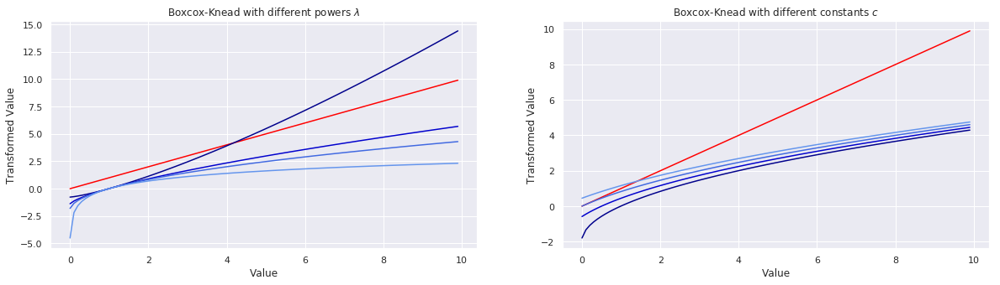

In [26]:
to_knead = np.arange(0,10,0.1)

fig, ax = plt.subplots(1,2,figsize=(20,5))

k = ax[0].plot(to_knead, to_knead, color="Red", label="to_knead")
e1 = ax[0].plot(to_knead, boxcox(to_knead + 0.01, 1.3), color="darkblue", label="0.7")
e2 = ax[0].plot(to_knead, boxcox(to_knead + 0.01, 0.7), color="mediumblue", label="0.7")
e3 = ax[0].plot(to_knead, boxcox(to_knead + 0.01, 0.5), color="royalblue", label="0.5")
e4 = ax[0].plot(to_knead, boxcox(to_knead + 0.01, 0.01), color="cornflowerblue", label="0.01")
ax[0].set_title("Boxcox-Knead with different powers $\lambda$")
handles=[k, e1, e2, e3, e4]
ax[0].set_xlabel("Value")
ax[0].set_ylabel("Transformed Value")
#ax[0].legend(handles)

k = ax[1].plot(to_knead, to_knead, color="Red", label="to_knead")
e1 = ax[1].plot(to_knead, boxcox(to_knead + 0.01, 0.5), color="darkblue", label="0.01")
e2 = ax[1].plot(to_knead, boxcox(to_knead + 0.5, 0.5), color="mediumblue", label="0.5")
e3 = ax[1].plot(to_knead, boxcox(to_knead + 1, 0.5), color="royalblue", label="1")
e4 = ax[1].plot(to_knead, boxcox(to_knead + 1.5, 0.5), color="cornflowerblue", label="1.5")
ax[1].set_title("Boxcox-Knead with different constants $c$")
ax[1].set_xlabel("Value")
ax[1].set_ylabel("Transformed Value")
handles=[k, e1, e2, e3, e4]
#ax[0].legend(handles)

Looking at the power parameter $\lambda$ of the boxcox transformation you can see that we are able to compress outliers more and more by chosing lower values of $\lambda$. In addition we obtain a "negative" stretching of low original values lower than one. If we fix $\lambda =0.5$ and vary the constant $c$ we can observe only slight differences of the high values compression. On the other hand we can see that the stretching of low values is even stronger of constants c close to zero. 

#### Take-away (not that simple but still good)

* If you like to compress outliers - chose a low $\lambda$
* If you like to stretch low values - chose a low $c$ close to zero.


### Transform! 

Ok, let's go! If you like, fork and chose other values. You will see that the resulting clusters highly depend on these hyperparameters!

In [27]:
constants = {"carbohydrates_100g": TransformParameter(const=0.01, lam=0.9, color="Green"),
            "fat_100g" : TransformParameter(const=0.1, lam=0.05, color="orange"),
            "proteins_100g": TransformParameter(const=0.1, lam=0.1, color="Red"),
             "sugars_100g" : TransformParameter(const=0.07, lam=0.03, color="Fuchsia"),
            "other_carbs" : TransformParameter(const=0.05, lam=0.3, color="maroon"),
            "salt_100g" : TransformParameter(const=0.01, lam=0.005, color="Dodgerblue"),
            "energy_100g" : TransformParameter(const=0.3, lam=0.7, color="Purple"),
            "reconstructed_energy" : TransformParameter(const=0.3, lam=0.7, color="mediumvioletred"),
            "g_sum": TransformParameter(const=0.1, lam=1.2, color="turquoise")}

In [28]:
for key in constants.keys():
    transform(data=nutrition_table,
              feature=key,
              constant=constants[key].const,
              lam=constants[key].lam)

### Visual comparison

Let's have a look at our transformed features:

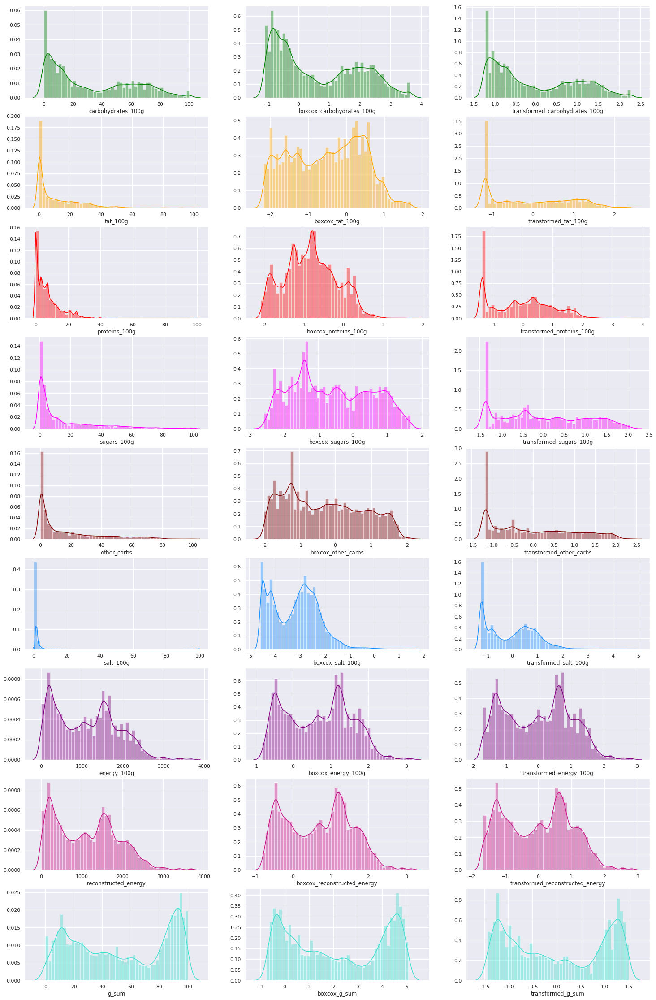

In [29]:
fig, ax = plt.subplots(9,3,figsize=(25,40))
n = 0
for feature in constants.keys():
    sns.distplot(nutrition_table[feature],
                 ax=ax[n,0],
                 color=constants[feature].color)
    sns.distplot(nutrition_table[nutrition_table[feature]>0]["boxcox_" + feature],
                 ax=ax[n,1],
                 color=constants[feature].color)
    sns.distplot(nutrition_table["transformed_" + feature],
                 ax=ax[n,2],
                 color=constants[feature].color)
    n+=1


Many of them look far better than before but the problem of setting optimal hyperparameters is still very difficult.

# Generate test and validation data <a class="anchor" id="test"></a>

* Find the optimal number of clusters (test)
* Show outlier/anomalie detection on unseen data with outliers! 

In [30]:
nutrition_table, test_table = train_test_split(nutrition_table, test_size=0.3, random_state=0)

# Training <a class="anchor" id="training"></a>

As already explained we will use the transformed and scaled features during the learning procedure to improve the update of the M-Step. A difficult and not obvious task is to chose the right amount of components of our mixture model. If you uncomment the code part "searching for the optimal amount of clusters" you can see that we tried to estimate the optimal number of components on test data.

In [31]:
features = ["transformed_carbohydrates_100g",
            "transformed_fat_100g",
            "transformed_proteins_100g",
            "transformed_sugars_100g",
            "transformed_salt_100g",
            "transformed_other_carbs",
            "transformed_energy_100g",
            "transformed_reconstructed_energy",
            "transformed_g_sum"]

### Searching for the optimal amount of clusters

We are faced with the challange to find the optimal number of components (clusters) for our gaussian mixture model. This is the second difficult part of our analysis. If we would chose to less components we would obtain clusters of mixed product types and far too broad ranged features per gaussian. For example, it does not make sense for one cluster to occupy the whole span from 0 to 100g of carbohydrates. In contrast if we choose too many components, we may find some fine-grained, special clusters of seldom products but we may also find separate clusters of the same product type. To understand what a more theoretical approach would advice us we ran GMM for different amount of components and took a look at three criteria: 

* The log-likelihood on the test data 
* The Bayesian Information Criterion (penalizes the log-likelihood with model complexity and number of data)
* The Akaike Information Criterion (only penailizes the log-likelihood with model complexity)


In [32]:
X_train = nutrition_table[features].values
X_test = test_table[features].values

In [33]:
print("Number of train samples: " + str(X_train.shape[0]))

Number of train samples: 179249


In [34]:
# ONLY uncomment, if you have at least an hour time to wait for computation! 
# scores = []
# bic = []
# aic = []
# to_try = range(11,81,10)
# for components in to_try:
    # model = GaussianMixture(n_components=components, covariance_type="full", random_state=1)
    # model.fit(X_train)
    # scores.append(model.score(X_test))
    # bic.append(model.bic(X_test))
    # aic.append(model.aic(X_test))

# fig, ax = plt.subplots(1,3,figsize=(25,5))
# ax[0].plot(to_try, scores)
# ax[1].plot(to_try, bic)
# ax[2].plot(to_try, aic)
# ax[0].set_xlabel("Number of components")
# ax[0].set_ylabel("Log-Likelihood")
# ax[1].set_xlabel("Number of components")
# ax[1].set_title("BIC")
# ax[1].set_ylabel("Penalized Log-Likelihood")

# ax[2].set_ylabel("Penalized Log-Likelihood")
# ax[2].set_xlabel("Number of components")
# ax[2].set_title("AIC")

#### Take-away

* The pure log-likelihood as well as the AIC and BIC tell us: "the more clusters, the better!"
* But we know we should be very careful. Products of the same kind could spread widely in their nutrition features according to many differences in the ingredients. In addition we are challanged by dirty and real data. User can make various of different errors like flipping nutrients while typing in the nutrition table or setting commas in numerical values on the wrong place. Even mistakes on purpose with wrong entries are possible. 

Consequently we will try another approach as well to select a sufficent number of clusters by looking at the correlation of features between different clusters.

In [35]:
components = 20

model = GaussianMixture(n_components=components,
                        covariance_type="full",
                        random_state=1,
                        n_init=1,
                        max_iter=200,
                        init_params="kmeans")
model.fit(X_train)
print("Model converged: " + str(model.converged_))

nutrition_table["cluster"] = model.predict(X_train)
test_table["cluster"] = model.predict(X_test)

Model converged: True


# Clustering of product types <a class="anchor" id="clustering"></a>

Fitting with 20 components seemed to be a good choice looking at cluster center correlations later in the analysis. Select 3 features of your choice and take a look at these interesting clusters:

* carbohydrates_100g
* fat_100g
* proteins_100g
* salt_100g
* other_carbs
* sugars_100g
* energy_100g
* reconstructed_energy
* g_sum

You can select the transformed features as well with "transformed_" + your_feature!

For the plot we only used 40000 data spots for stability reasons of plotly.

In [36]:
plot_features = ["transformed_carbohydrates_100g", "transformed_proteins_100g", "transformed_fat_100g"]
#plot_features = ["carbohydrates_100g", "proteins_100g", "fat_100g"]

In [37]:
nutrition_table["product"] = original.loc[nutrition_table.index, "product_name"]

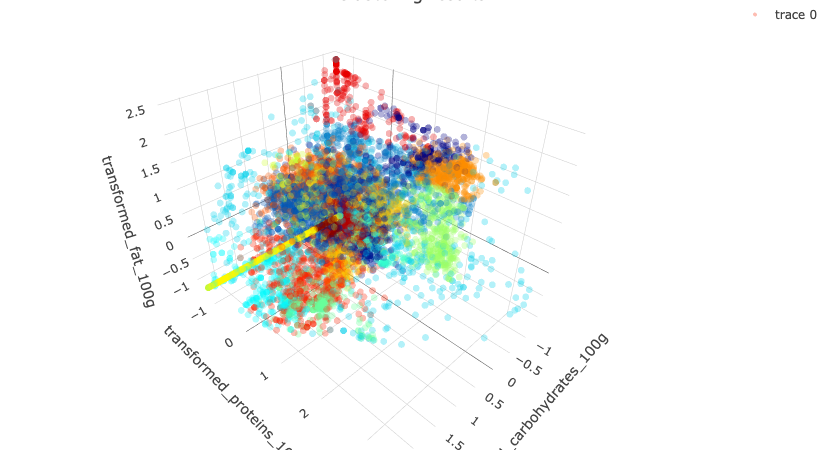

In [38]:
N = 10000

trace1 = go.Scatter3d(
    x=nutrition_table[plot_features[0]].values[0:N], 
    y=nutrition_table[plot_features[1]].values[0:N],
    z=nutrition_table[plot_features[2]].values[0:N],
    mode='markers',
    text=nutrition_table["product"].values[0:N],
    marker=dict(
        color=nutrition_table.cluster.values,
        colorscale = "Jet",
        opacity=0.3,
        size=4
    )
)

figure_data = [trace1]
layout = go.Layout(
    title = 'Clustering results',
    scene = dict(
        xaxis = dict(title=plot_features[0]),
        yaxis = dict(title=plot_features[1]),
        zaxis = dict(title=plot_features[2]),
    ),
    margin=dict(
        l=0,
        r=0,
        b=0,
        t=0
    ),
    showlegend=True
)

fig = go.Figure(data=figure_data, layout=layout)
py.iplot(fig, filename='simple-3d-scatter')

### Take-away

* Every cluser belongs to a component that has its own covariance matrice. As we allowed full matrices during training we can see clusters of various sizes and densities. This is one advantage of using the gaussian mixture model.
* However some less dense clusters in boundary regions show some outliers even though they have a compact and dense base structure. In these cases we are curious if the model is centrain about its cluster assignment or if it detected those points as anomalies. 
* If you compare the scattered data of original and transformed features you can see that our preprocessing was able to expand the room the data occupies. This way we uncovered substructures that would have been hidden using the skewed original feature distributions. 
* We can find a cluster that somehow looks like protective shield. It seems to hold all outliers in the data and its cluster center may be located somewhere in the middle of all data. That is very interesting! We haven't expected that!

## How much data is covered per cluster?

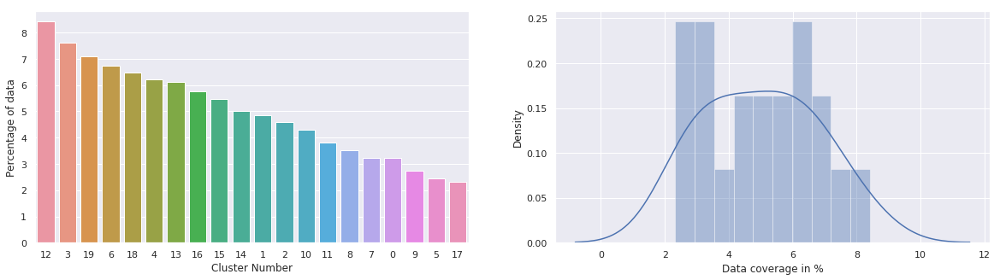

In [39]:
cluster_count = nutrition_table.cluster.value_counts()

fig, ax = plt.subplots(1,2,figsize=(20,5))
sns.barplot(x=cluster_count.index,
            y=cluster_count.values / nutrition_table.shape[0] * 100,
            order=cluster_count.index, ax=ax[0])
ax[0].set_xlabel("Cluster Number")
ax[0].set_ylabel("Percentage of data")
sns.distplot(cluster_count.values / nutrition_table.shape[0] * 100, bins=10, ax=ax[1])
ax[1].set_xlabel("Data coverage in %")
ax[1].set_ylabel("Density");

### Take-away

* It's evident that the majority of our clusters encompass approximately 5% of our dataset. However, there are outliers with notably low or high coverage, and it's crucial to investigate these clusters further.

* Our focus now should be on understanding the product types and specific feature ranges associated with these atypical clusters. This exploration will shed light on whether these clusters are heterogeneous or if utilizing additional components in our mixture model would enhance its accuracy.

* Identifying the product categories and feature variations within these outlier clusters will provide insights into the potential need for adjusting the mixture model. This analysis will help us discern whether these clusters contain diverse product types or if they represent specific outliers that require a different modeling approach.

* By delving into these outliers, we can refine our understanding of the dataset's structure and make informed decisions about optimizing our mixture model for improved accuracy and representation of the data.

## Can we reveal the hidden product type?

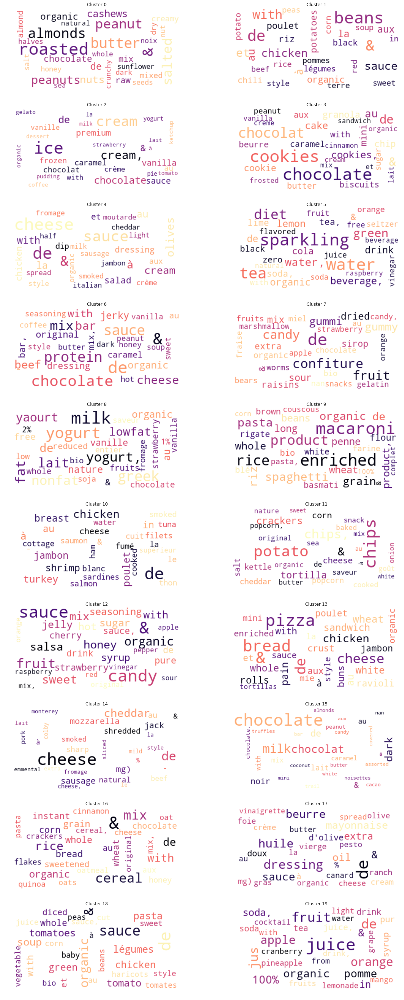

In [40]:
nutrition_table["product"] = original.loc[nutrition_table.index, "product_name"]

fig, ax = plt.subplots(10,2, figsize=(20,50))
for m in range(10):
    for n in range(2):
        cluster = m*2+ n
        title = "Cluster " + str(cluster) 
        make_word_cloud(nutrition_table, cluster, ax[m,n], title)

### Take-away

* First of all: YES! We can find hidden product categories. That's amazing! No one told Gaussian Mixture something about product names or types. Only dealing with nutrition table information it was able to group similar products. We can find various interesting clusters of chocolate, pasta, ice cream, cheese, yoghurts, juice, grains, sauces, meat, water and nuts.
* On the goarse-grained view our clustering was very successful. But if you take a closer look you may wonder why some clusters hold similar products or seem to be of a mixed type like cluster 6.

For this reason, some more question arise:
1. How sure is our model about our cluster assignments?
2. How valid is the data in context of app user errors given a cluster?

In [41]:
nutrition_table[nutrition_table["cluster"]==19]["product"].value_counts().head()

nan            131
Apple Sauce     82
Soda            67
Cola            61
Applesauce      40
Name: product, dtype: int64

In [42]:
cluster_names = {
    0: "nuts and seeds",
    1: "beans & peas",
    2: "ice cream",
    3: "cookies",
    4: "creams & dips",
    5: "water and diet drinks",
    6: "strange cluster 6",
    7: "gummy bears & fruit snacks",
    8: "yoghurt and milk",
    9: "pasta & noodles",
    10: "cottage cheese and shrimps",
    11: "chips & popcorn",
    12: "strange cluster 12",
    13: "pizza, tortillas",
    14: "cheese",
    15: "chocolate",
    16: "grains & flours",
    17: "mayonnaise & oils",
    18: "tomato sauce",
    19: "sweet drinks"
}

In [43]:
nutrition_table["category"] = nutrition_table.cluster.map(cluster_names)

## How similar are different clusters?

To obtain a first impression of the similarity of our clusters we can look at the correlation of the cluster center:

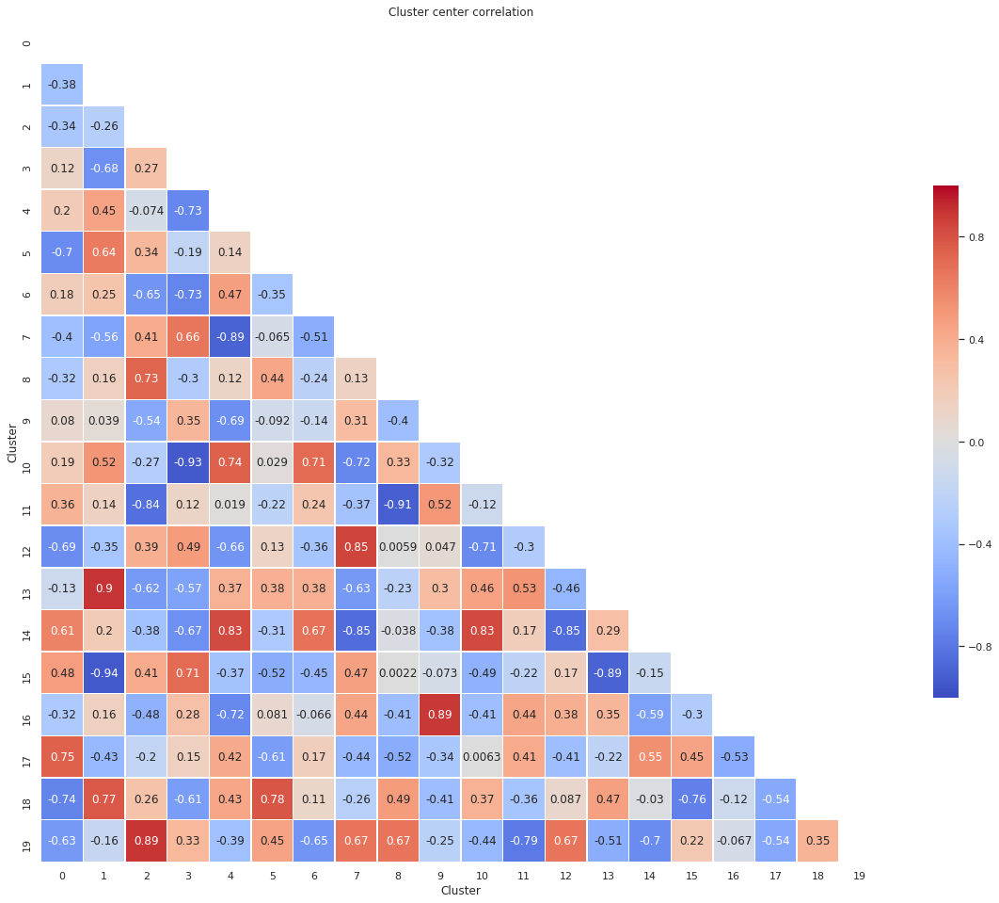

In [44]:
cluster_stats = pd.DataFrame(data=model.means_)
sns.set(style="white")
corr = cluster_stats.transpose().corr()

mask = np.zeros_like(corr, dtype=np.bool)
mask[np.triu_indices_from(mask)] = True

f, ax = plt.subplots(figsize=(20, 20))
sns.heatmap(corr, mask=mask, cmap="coolwarm",
            vmin=-1, vmax=1, square=True, center=0,
            linewidths=.5, cbar_kws={"shrink": .5},
           annot=True)
ax.set_xlabel("Cluster")
ax.set_ylabel("Cluster")
ax.set_title("Cluster center correlation");

### Take-away

* Many clusters do not correlate or show anti-correlation. This is what we like to have as we want them do be dissimilar in the feature space. This way we can make sure that they can cover different type of products. 
* Unfortunately we also find some high correlating clusters that have nearby cluster centers like the pasta cluster 9 and the whole grain cluster 16. In this case it seems to make sense. Even though these kind of products are very similar, pasta seems to be different from whole grain. That's cool! But we should try to understand in the feature space what makes this difference.

## How are the nutrients of different clusters distributed? 

In [45]:
nutrients = ["fat_100g",
             "proteins_100g",
             "carbohydrates_100g",
             "sugars_100g", 
             "other_carbs",
             "salt_100g",
             "g_sum"]
energies = ["energy_100g", "reconstructed_energy"]

transformed_nutrients = ["transformed_" + nutrient for nutrient in nutrients]
transformed_energies = ["transformed_" + energy for energy in energies]

In [46]:
cluster_pair = [9,16]

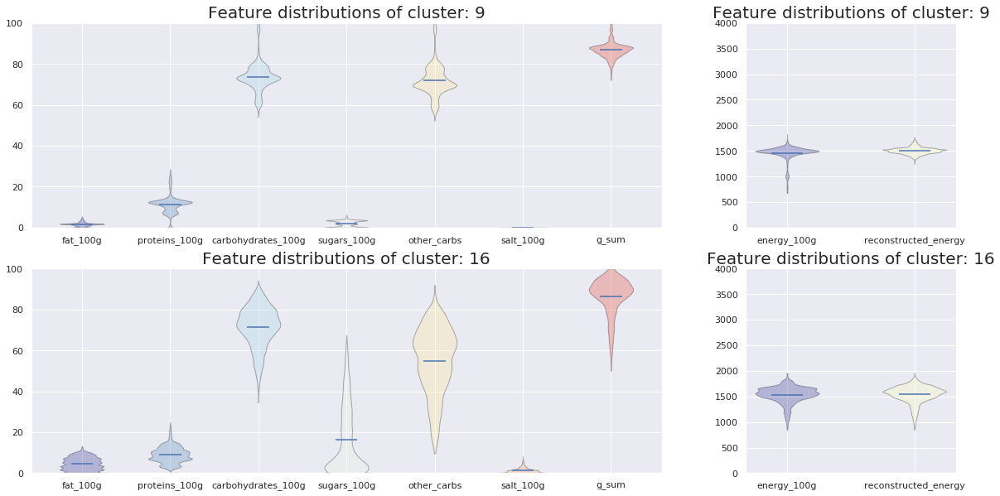

In [47]:
sns.set()

fig, ax = plt.subplots(2,2,gridspec_kw = {'width_ratios':[3, 1]}, figsize=(20,10))
pair00 = make_violin(ax[0,0], cluster_pair[0], nutrients)
ax[0,0].set_ylim([0,100])
pair01 = make_violin(ax[0,1], cluster_pair[0], energies)
ax[0,1].set_ylim([0,4000])
pair10 = make_violin(ax[1,0], cluster_pair[1], nutrients)
ax[1,0].set_ylim([0,100])
pair11 = make_violin(ax[1,1], cluster_pair[1], energies)
ax[1,1].set_ylim([0,4000]);

### Take-Away

* Comparing two clusters of our choice we can obtain an deeper understanding why similar clusters are still different. They are often very close in all features in the transformed feature space, sometimes the feature distributions overlap. But even if they are very close together small and tiny shifts in some features make the difference. 
* In the case of the pasta and grain cluster we can see that pasta has a little lower fat and higher protein than the whole grain cluster. In contrast, the grain cluster holds more products with various amounts of sugars and salt.
* Looking at the mixed type cluster 6 we can see that it covers outliers of each feature distribution. You might wonder and ask yourself why we still see broad distributions on low values as well but this can be explained when you keep in mind, that an outlier might only occur in one or few features per product whereas all others behave normal. 
* Comparing cluster 6 and 12 we can observe that they are very similar as well. They both cover varios products over all feature ranges. They only differ in the amount of fat, proteins and carbohydrates. Whereas cluster 12 holds products with zero fat and zero proteins, but a borad range from 0 to 100 g carbohydrates (& sugars), cluster 6 expands the whole feature space. Consequently cluster 12 touches the 0-fat-0-protein plane whereas cluster 6 is a crowd more in the middle of the room.
* These difference of cluster 6 and 12 somehow reflects the problem that we have many discrete 0-entries for proteins, fat and carbohydrates. In our opinion it does not make sense to have two outlier-clusters that are nearly the same. We will come to this problem in our outlook again and give a deeper explanation of this problem.

## How dense are our clusters?

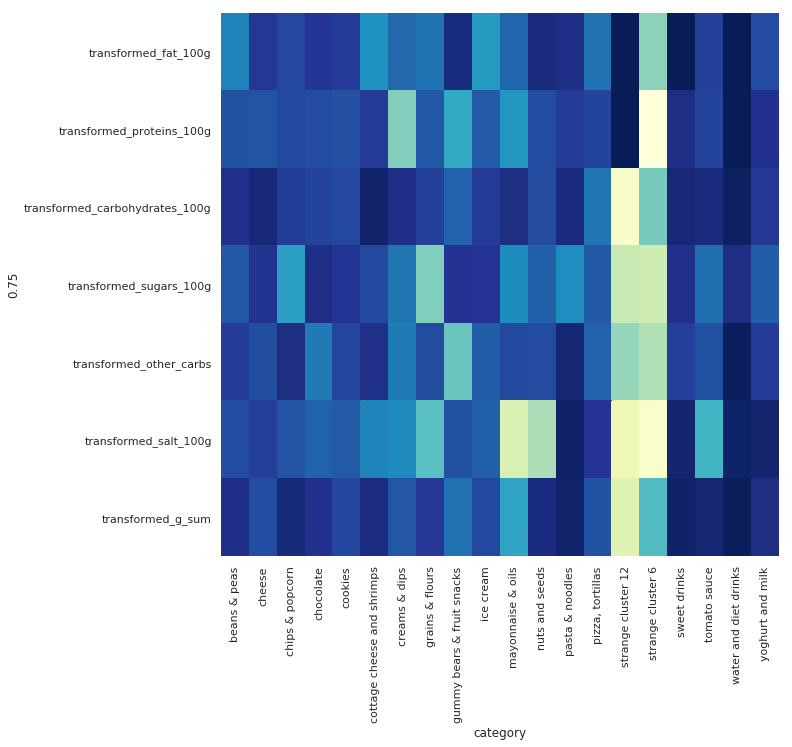

In [48]:
plt.figure(figsize=(10,10))
q75 = nutrition_table.groupby("category")[transformed_nutrients].quantile(0.75)
q25 = nutrition_table.groupby("category")[transformed_nutrients].quantile(0.25)
iqr = q75-q25
sns.heatmap(iqr.transpose(), cmap="YlGnBu_r", cbar=False);

### Take-Away
* The clusters differ a lot in their densities
* Cluster 5 has the highest desity, which makes sense when we look at the produkt-types - beverages.  Products of this group all have in common that they contain almost no fat, proteins and salt. Only the sugar component differs due to sweet drinks like soda and unsweetened drinks like water. For this reason the sugar component has the lowest density.
* Cluster 6 hast the lowest density. That makes sense as cluster 6 contains the most outlier products. For this reason it's the most mixed cluster of all - the product-types differ a lot and so do their nutritions.
* There are also some other clusters with a quite high or low density:
    * Cluster 12 has low density in carbohydrates, sugars, non-sugar-carbohydrates, salt and the g_sum. It contains candy, fruits and sauces and is of mixed type as well. As cluster 6 it contains many outliers that causes the low density.
    * Cluster 8 and 19 have high densities in almost every feature. If we compare with the word-clouds we can see that they are very homogenous: milk & joghurts cluster and juices cluster.

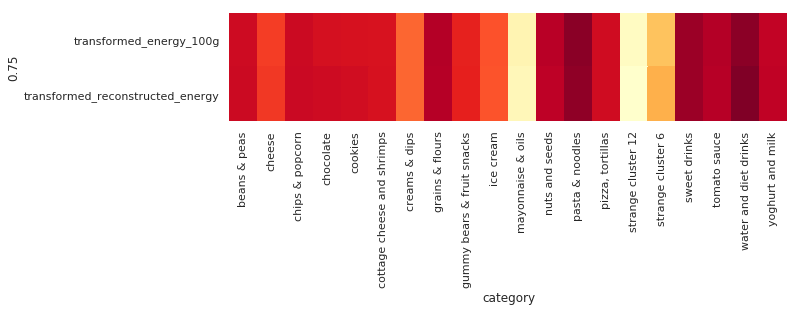

In [49]:
plt.figure(figsize=(10,2))
q75 = nutrition_table.groupby("category")[["transformed_energy_100g",
                                          "transformed_reconstructed_energy"]].quantile(0.75)
q25 = nutrition_table.groupby("category")[["transformed_energy_100g",
                                          "transformed_reconstructed_energy"]].quantile(0.25)
iqr = q75-q25
energy_difference = iqr.transformed_energy_100g - iqr.transformed_reconstructed_energy
sns.heatmap(iqr.transpose(), cmap="YlOrRd_r", cbar=False);

* In the energy-densities you can see a lot of different densities as well.
* Cluster 5 and 9 have the highest densities. Cluster 5 (beverage) also has the highest density in its other features, but cluster 9 (pasta) also has a very high density - only sugars are a bit less dense.
* Cluster 12, 6 and 17 have the lowest densities. Cluster 12 and 6 are outlier clusters. Consequently it makes sense that they are of low density. Interestingly cluster 17 (sauces & dressings) is of low density es well. It seems to hold salt outliers, as this feature is its most less dense of all features. 

# Certainty Analysis <a class="anchor" id="uncertainty"></a>

Wouldn't it be nice to find out what kind of products are somehow inbetween of two or more clusters? 

We are lucky! Our Gaussian Mixture Model is a probabilistic model that can tell us, how certain it was during its cluster assignments. Intuitively one would say: "Let's take a look at $\pi_{k} N(\mu_{k}, \Sigma_{k})$ per cluster component. But as we want a probability, we need to normalize over all components of our model. Looking at the E-Step, we can see that this are our converged responsibilities! :-) During the E-Step our model calculates how responsible some cluster $k$ is for some data spot $n$. Consequently we can try to understand for which kind of products or model is not certain about in its cluster assignment. This is a great advantage of Gaussian Mixture compared to non-probabilistic models like K-Means.

## How certain are our cluster assignments?

In [50]:
species_probas = model.predict_proba(X_train)
best_species_idx = np.argmax(species_probas,axis=1)

color = np.zeros(best_species_idx.shape[0])
for n in range(len(color)):
    color[n] = np.round(species_probas[n,best_species_idx[n]], 4)
nutrition_table["certainty"] = color

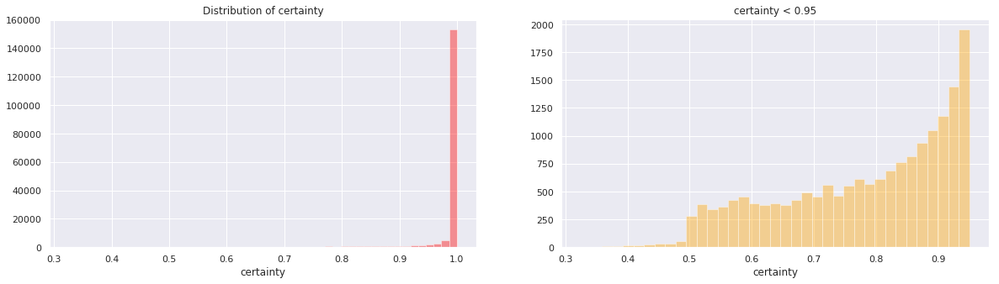

In [51]:
fig, ax = plt.subplots(1,2, figsize = (20,5))
sns.distplot(nutrition_table.certainty, color = "red", ax = ax[0],kde = False)
sns.distplot(nutrition_table.certainty[nutrition_table.certainty < 0.95], color = "orange", kde = False)
ax[0].set_title("Distribution of certainty")
ax[1].set_title("certainty < 0.95");

Obviously our model is very certain about its cluster assignments for the majority of the data spots. Looking at samples with centainty below 95 % we can see a sharp break at 0.5. Consequently there are only very few samples that our model is really not sure to which cluster they should belong. We shall check whether these points could be outliers or anomalies. 

## Are there some clusters with high uncertainty?

Perhaps we have some cluster with more uncertain assigments than others. And perhaps similar clusters are both more uncertain. Let's find it out!

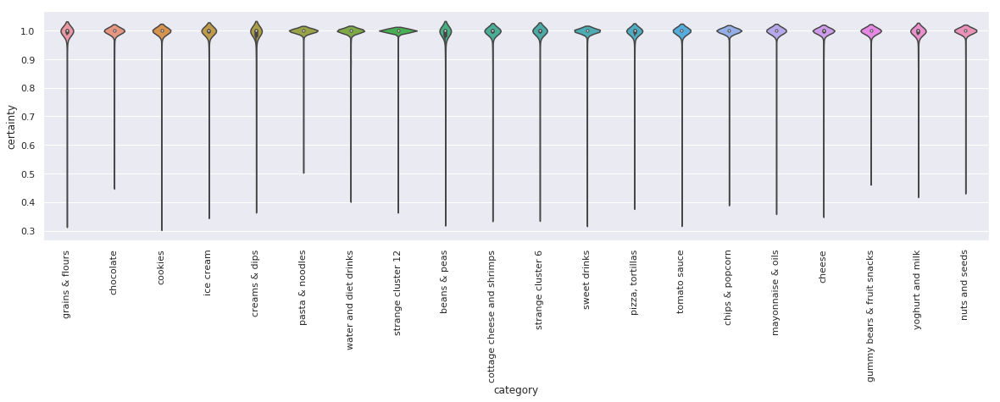

In [52]:
plt.figure(figsize=(20,5))
sns.violinplot(x="category", y="certainty", data=nutrition_table);
plt.xticks(rotation=90);

We can't find an obvious pattern!

## How do certain and uncertain product names look like?

Looking at the distributions of cluster assignment certainty we can't find interesting relationships. Probably the product name is more informative to find interesting patterns:

In [53]:
cluster_pair=[9, 16]

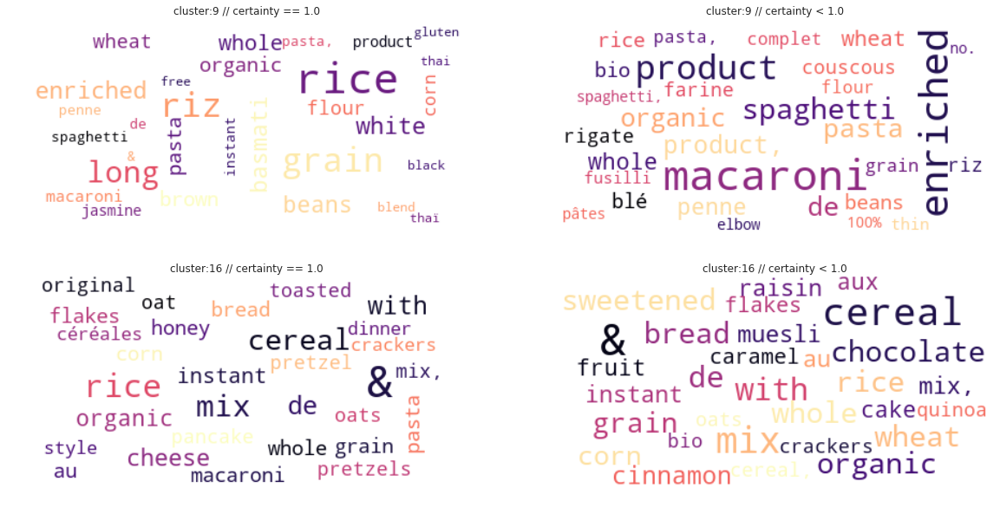

In [54]:
fig, ax = plt.subplots(2,2, figsize = (20,10))
make_word_cloud(nutrition_table[nutrition_table.certainty == 1.],
                cluster_pair[0],
                ax[0,0],
                title = "cluster:" + str(cluster_pair[0]) + " // " + "certainty == 1.0")
make_word_cloud(nutrition_table[nutrition_table.certainty < 1.],
                cluster_pair[0],
                ax[0,1],
                title = "cluster:" + str(cluster_pair[0]) + " // " + "certainty < 1.0")

make_word_cloud(nutrition_table[nutrition_table.certainty == 1.],
                cluster_pair[1],
                ax[1,0],
                title = "cluster:" + str(cluster_pair[1]) + " // " + "certainty == 1.0")
make_word_cloud(nutrition_table[nutrition_table.certainty < 1.],
                cluster_pair[1],
                ax[1,1],
                title = "cluster:" + str(cluster_pair[1]) + " // " + "certainty < 1.0")

### Take-Away

* Cool! That's great! Data spots of high certainty are even closer in the product name/type. 
* In contrast those with less certainty are often different in the product type. 
* The pasta and grain clusters for example show some overlaps in the uncertain data spots. There are some cereals in the pasta cluster that our model is uncertain about that are maybe under the hood of the grain cluster as well with a second peak of resposibility there. These would be products "inbetween". 

We should gain a deeper understanding of competing clusters by looking at the second highest responsibility per data spot and cluster. Let's visualize this competitor distribution with a heatmap. 

## Which cluster was the second choice of certainty per cluster?

For this step we only take into account uncertain data spots with a certainty below 95 %. This way we can clearly see which is a competing cluster for those samples. 

In [55]:
nutrition_table["alternative_cluster"] = np.argsort(species_probas, axis=1)[:,-2]
nutrition_table["alternative_category"] = nutrition_table.alternative_cluster.map(cluster_names)
uncertain_table = nutrition_table[nutrition_table.certainty < 0.95]

In [56]:
competition = np.round(100 * uncertain_table.groupby(
    "category").alternative_category.value_counts() / uncertain_table.groupby(
    "category").alternative_category.count())
competition = competition.unstack()
competition.fillna(0, inplace=True)

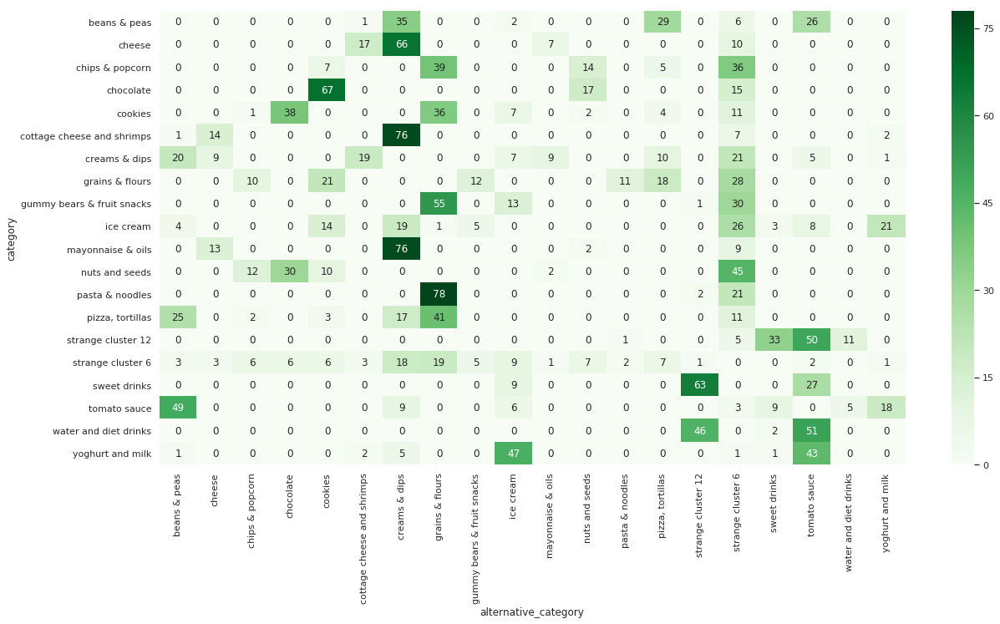

In [57]:
plt.figure(figsize=(20,10))
sns.heatmap(competition, cmap="Greens", annot=True, fmt="g");

### Take-Away

* That's again cool! Our pasta cluster 9 for example has in around 78 % of uncertain cases a high responsibility for the grain cluster 16. The other major uncertainties of the pasta cluster are assigned to our mixed type - outlier - cluster 6. 
* In contrast our grain cluster 16 shows only low percentage in uncertain cases for the pasta cluster, namely 11 %. Consequently we can't conclude that if two cluster compete that they do it in both directions!
* This heatmap is really an advantage if you like to know which clusters or groups are somehow interacting.
* One interesting competing cluster is the creamy, cheesy cluster 4. Many clusters like the meat cluster 10, the cheese cluster 14 and the virgin oil and sauces cluster 17 are in love with it. If you compare the features in the violinplot above, we can see that the cluster 4 covers a broad range of proteins, fat and salt. This causes the high tendency of second highest resposibilites.

### Certainty 3D Scatterplot

Just to obtain an impression how uncertainty of cluster assignments are looking in the feature space:

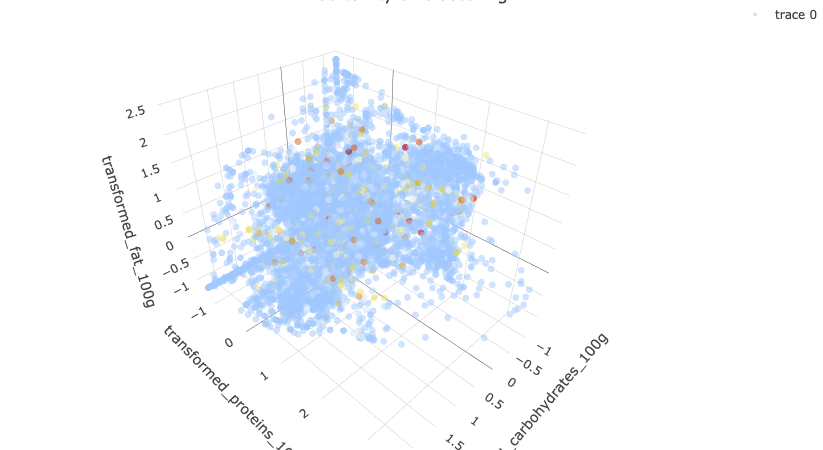

In [58]:
trace2 = go.Scatter3d(
    x=nutrition_table[plot_features[0]].values[0:N], 
    y=nutrition_table[plot_features[1]].values[0:N],
    z=nutrition_table[plot_features[2]].values[0:N],
    mode='markers',
    text = nutrition_table["product"].values[0:N],
    marker=dict(
        color= color,
        colorscale = "Blackbody",
        opacity=0.5,
        size=4
    )
)

figure_data = [trace2]
layout = go.Layout(
    title = 'Certainty of Clustering',
    scene = dict(
        xaxis = dict(title= plot_features[0]),
        yaxis = dict(title= plot_features[1]),
        zaxis = dict(title= plot_features[2]),
    ),
    margin=dict(
        l=0,
        r=0,
        b=0,
        t=0
    ),
    showlegend=True
)

fig = go.Figure(data=figure_data, layout=layout)
py.iplot(fig, filename='simple-3d-scatter')

# Anomaly detection <a class="anchor" id="anomalies"></a>

The last and perhaps the most important part of the app is anomaly detection. But first of all, what is meant by an anomaly in the view of a gaussian mixture model? Before we start, we should be certain about the answer. Let's recap the formulation of the Gaussian Mixture Model:

$$ p(x) = \sum_{k=1}^{K} \pi_{k} \cdot N(x|\mu_{k}, \Sigma_{k})$$

This sum yields a so called probability density function. If you are not very familiar with measure theory you are in good company. If we assume that all data spots are drawn randomly from that density distribution and finally take the natural log, we would end up with the following formula:

$$ \ln p(x) = \sum_{n=1}^{N} ln \sum_{k=1}^{K} \pi_{k} \cdot N(x_{n}|\mu_{k}, \Sigma_{k}) $$

The stuff we need to score each data spot is now given by:

$$ \ln p_{n}(x) = \ln \sum_{k=1}^{K} \pi_{k} \cdot N(x_{n}|\mu_{k}, \Sigma_{k}) $$

This is what we obtain by calling score samples of scikit-learns gaussian mixture model. But what does it tell us? We think that it is a measure how dense the region is where data spot $x_{n}$ is located. Consequently in low dense regions of our probability density function this would yield a low number. Let's go further - what can be detected as anomaly in low dense regions?

* outliers that could be errors
* seldom products

We should keep in mind that there is one kind of error we will not detect as anomaly: Imagine a user typed in nutrition table information that contains flips between features or a wrong product name. This kind of data spot can be located in dense regions and perfectly match with some cluster. Consequently we would not detect it as an anomaly and we can't find it as an error! 

In [59]:
log_prob = model.score_samples(X_train)

## How can we define at which density it's anomal?

The scoring of data points only yields sample log-likelihoods. No one tells us, if the sample is anomalous or not and we must define a criteria or some other strategy to proceed. In this case we decided to use a threshold that is based on the p-quartile of your choice. We set it by looking at the distribution over all sample-log-likelihoods. At the point were the distribution shows a sharp increase we set its value. This way we made sure that all spots in low dense regions are called an anomaly.   

In [60]:
your_choice = 0.07

For us a value of 7 % anomalies in the data seemed to be suitable. Try another value if you like ;-) !

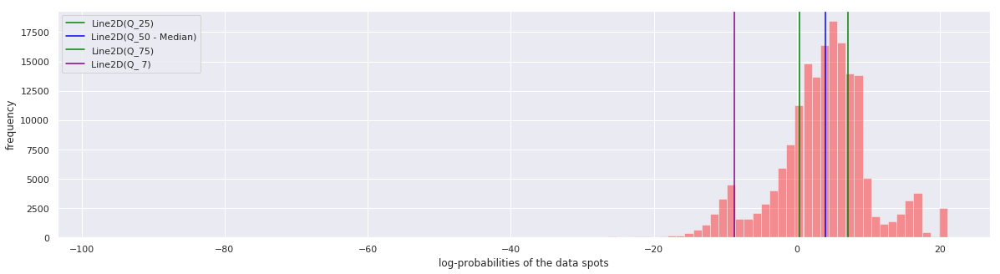

In [61]:
plt.figure(figsize=(20,5))

sns.distplot(log_prob, kde=False, bins=100, color="Red")
g1 = plt.axvline(np.quantile(log_prob, 0.25), color="Green", label="Q_25")
g2 = plt.axvline(np.quantile(log_prob, 0.5), color="Blue", label="Q_50 - Median")
g3 = plt.axvline(np.quantile(log_prob, 0.75), color="Green", label="Q_75")
g4 = plt.axvline(np.quantile(log_prob, your_choice), color="Purple", label="Q_ %i" % (int(your_choice*100)))
handles = [g1, g2, g3, g4]
plt.xlabel("log-probabilities of the data spots")
plt.ylabel("frequency")
plt.legend(handles);

In [62]:
outliers = get_outliers(log_prob, your_choice)
nutrition_table["anomaly"] = outliers

## Is the percentage of anomalies dependent on the cluster?

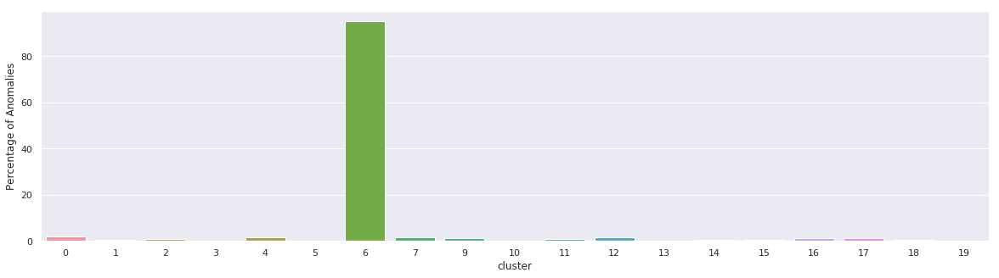

In [63]:
anomalies_per_cluster = nutrition_table.groupby("cluster").anomaly.value_counts() / nutrition_table.groupby("cluster").anomaly.count()
reset = anomalies_per_cluster.reset_index(level="cluster")
percentage_anomalies = reset.loc[1].set_index("cluster", drop=True)

plt.figure(figsize=(20,5))
sns.barplot(x=percentage_anomalies.index, y=percentage_anomalies.anomaly.values * 100)
plt.ylabel("Percentage of Anomalies");

We found that some clusters have a very high percentage of anomalies or are completely occupied by them. We have already seen that cluster 6 has the tendency to hold all outliers. Consequently it's not strange that it mainly consists of data spots in low dense regions. Let's try to find out, how certain the cluster assignment of anomalies is and how they look like in some example clusters.

## What can we tell about the anomaly cluster 6 and its counterpart 12 ?

We have found one special cluster that holds many high outlier products. Let's try to understand this special kind of cluster:

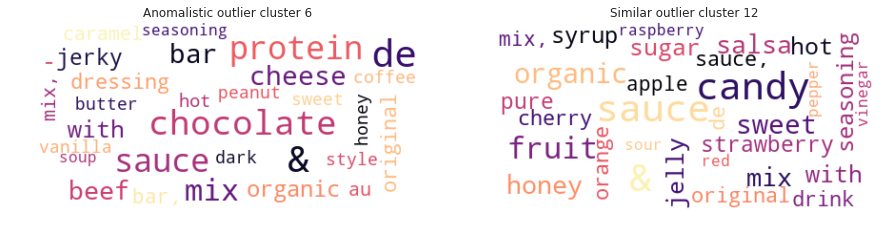

In [64]:
fig, ax = plt.subplots(1,2,figsize=(15,5))
make_word_cloud(nutrition_table,
                6,
                ax[0],
                title = "Anomalistic outlier cluster 6")
make_word_cloud(nutrition_table,
                12,
                ax[1],
                title = "Similar outlier cluster 12")

In [65]:
features = ["energy_100g", "reconstructed_energy"]

(0, 4000)

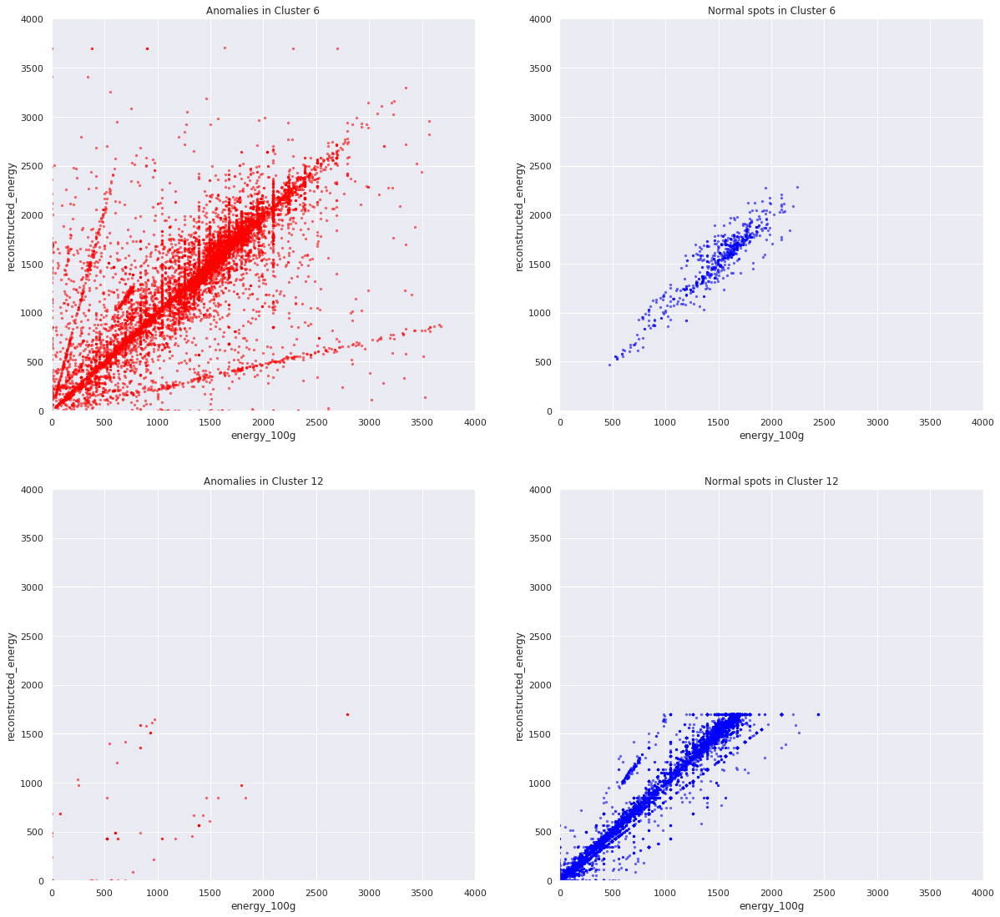

In [66]:
def get_values(cluster, feature, anomal):
    x = nutrition_table[(nutrition_table.cluster == cluster) & (nutrition_table.anomaly==anomal)][feature].values
    return x

size = 5
alpha = 0.5

fig, ax = plt.subplots(2,2, figsize = (20,19))
ax[0,0].scatter(get_values(6, features[0], 1),get_values(6, features[1], 1), c = "red",s=size, alpha=alpha)
ax[0,1].scatter(get_values(6, features[0], 0), get_values(6, features[1], 0), c = "blue",s=size, alpha=alpha)
ax[1,0].scatter(get_values(12, features[0], 1), get_values(12, features[1], 1), c = "red",s=size, alpha=alpha)
ax[1,1].scatter(get_values(12, features[0], 0), get_values(12, features[1], 0), c = "blue",s=size, alpha=alpha)
for n in range(2):
    for m in range(2):
        ax[n,m].set_xlabel(features[0])
        ax[n,m].set_ylabel(features[1])
ax[0,0].set_title("Anomalies in Cluster 6")
ax[0,1].set_title("Normal spots in Cluster 6")
ax[1,0].set_title("Anomalies in Cluster 12")
ax[1,1].set_title("Normal spots in Cluster 12")

ax[0,0].set_xlim([0,4000])
ax[0,1].set_xlim([0,4000])
ax[1,0].set_xlim([0,4000])
ax[1,1].set_xlim([0,4000])
ax[0,0].set_ylim([0,4000])
ax[0,1].set_ylim([0,4000])
ax[1,0].set_ylim([0,4000])
ax[1,1].set_ylim([0,4000])

### Take-away

* This plot looks so easy! But it has the most impact for further analysis!
* On the left hand side you can see products that were marked as "anormal data" and on the right hand side you can see what the model calles "nomal". 
* Cluster 6 is our anomaly cluster that spreads widely into the feature space. We can see that the detection of anomalies worked well for its cluster members. Every spot that shows a discrepancy between energy and the reconstructed energy based on the typed-in nutrients was detected as anomal. That's what we want to have!
* Cluster 12 in contrast sits with his back on the zero-zero-plane of fats and proteins. All data spots in this cluster have zero fat and zero proteins. For all other features the cluster spreads widely into the space like cluster 6 does. **Now your alarm bells should ring** ... Why are both clusters that different in anomaly detection? Why went something wrong with cluster 12? We still expect to detect errors of energy discrepancies as anomalies.
* **BOOM** Here it comes out very clear - our model assumptions don't fit to our data! We used gaussian mixture to show its advantages over simple clusterings like k-means and we transformed features to make them more like gaussians. **But you see... our data is neither completely continouus nor discrete.** We have discrete zero-entries per feature that do not fit to a gaussian and continuous values that spread widely and would fit to a gaussian approach. 
* This plot motivates to introduce and build a more sophisticated model that can deal with this half-half nature of our data. We need to somehow glue Bernoullis and Gaussians to lead this model to success.

## How certain is our model about its anomalies in cluster assignment ?

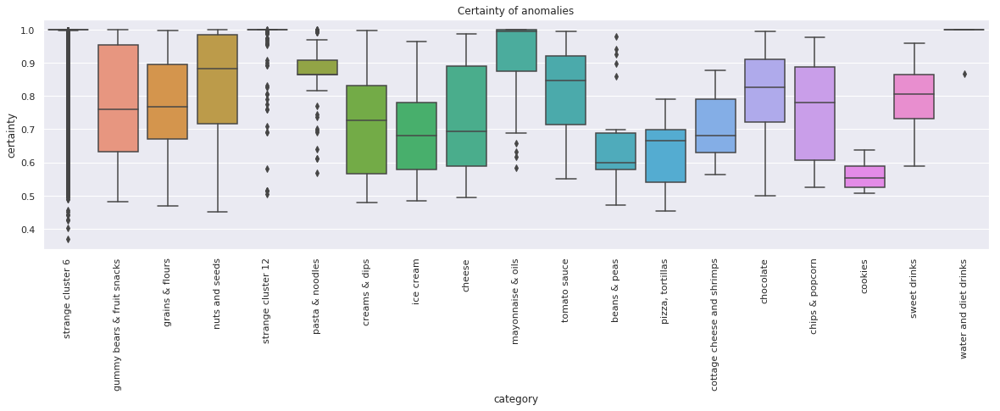

In [67]:
plt.figure(figsize=(20,5))
sns.boxplot(x="category", y="certainty", data=nutrition_table[nutrition_table.anomaly==1])
plt.title("Certainty of anomalies");
plt.xticks(rotation=90);

### Take-Away

* We can find some very interesting patterns: In cluster 5 (water), 6 (mixed outlier cluster), 12 (sweets & sauces) and 17 (oils and cream dressings) the model is very certain in its cluster assignments in most of the anomaly cases! 
* In contrast cluster 3 (chocolate & cookies) and 1 (potatoes and beans) the model is very uncertain (below 0.6) about the cluster assignments of the majority of its anomalies. 
* Looking at all clusters we can see that most of them spread widely in their certainties.

## How do anomalies of normal clusters look like?

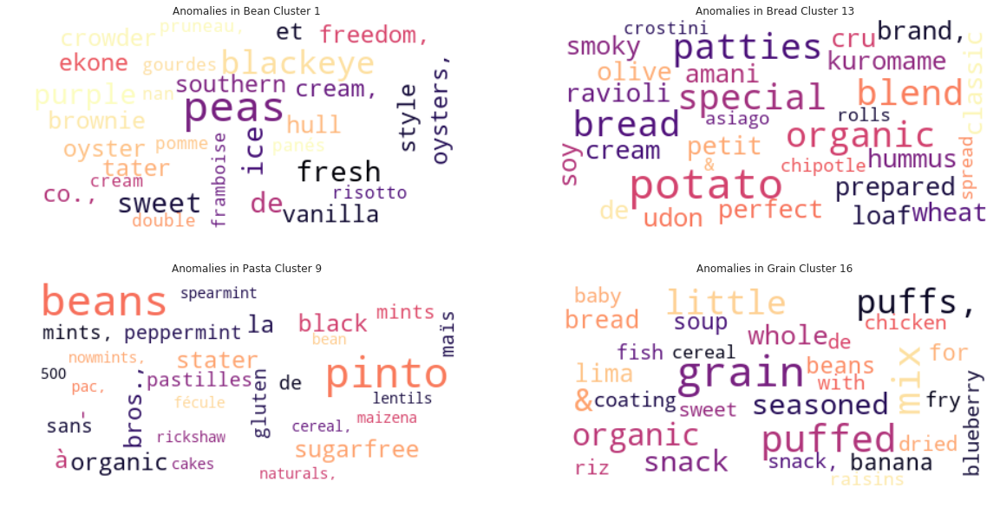

In [68]:
fig, ax = plt.subplots(2,2, figsize=(20,10))
make_word_cloud(nutrition_table[nutrition_table.anomaly==1], 1, ax[0,0], "Anomalies in Bean Cluster 1")
make_word_cloud(nutrition_table[nutrition_table.anomaly==1], 13, ax[0,1], "Anomalies in Bread Cluster 13")
make_word_cloud(nutrition_table[nutrition_table.anomaly==1], 9, ax[1,0], "Anomalies in Pasta Cluster 9")
make_word_cloud(nutrition_table[nutrition_table.anomaly==1], 16, ax[1,1], "Anomalies in Grain Cluster 16");

### Take-Away

* By looking at the most common product names of anomalies per cluster we can see different kinds:
    *  We can find **outlier products like blackeye peas, pumpernickel, puffed grain, products without gluten**
    * But we can also find **seldom products** that do not fit to their clusters like **sugarfree products** in pasta cluster for example
* Besides these outliers there are probably user errors of the data type-in input process as well. We don't know! 

### Visualizing anomalies

In [69]:
plot_features = ["energy_100g", "reconstructed_energy", "g_sum"]

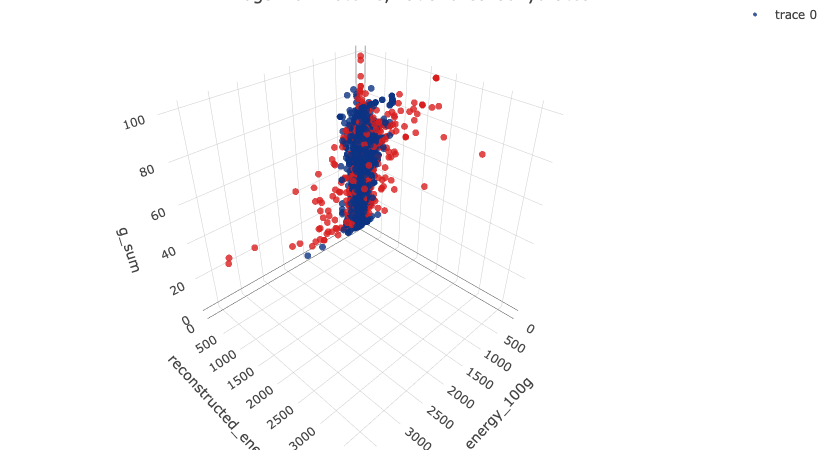

In [70]:
trace2 = go.Scatter3d(
    x=nutrition_table[plot_features[0]].values[0:N], 
    y=nutrition_table[plot_features[1]].values[0:N],
    z=nutrition_table[plot_features[2]].values[0:N],
    mode='markers',
    text = nutrition_table["product"].values[0:N],
    marker=dict(
        color=nutrition_table.anomaly.values,
        colorscale = "Portland",
        opacity=0.8,
        size=4
    )
)

figure_data = [trace2]
layout = go.Layout(
    title = 'Log3D of Proteins, Fat and Carbohydrates',
    scene = dict(
        xaxis = dict(title=plot_features[0]),
        yaxis = dict(title=plot_features[1]),
        zaxis = dict(title=plot_features[2]),
    ),
    margin=dict(
        l=0,
        r=0,
        b=0,
        t=0
    ),
    showlegend=True
)

fig = go.Figure(data=figure_data, layout=layout)
py.iplot(fig, filename='simple-3d-scatter')

In [71]:
nutrition_table.to_csv("hidden_treasures_groceries_gmm.csv")

# Estimating nutrition scores

We found out that we can cluster similar products given the nutrition table. A great extension of our solution is that we can use the nutrition table information as well as all important clustering results like the binary anomaly score, the logL, the cluster responsibilities and assignment to predict the nutrition score of a product in the database. 


### Beverages

* **Group A**: Water 
* **Group B**: -15 to -1
* **Group C**: 2 to 5
* **Group D**: 6 to 9
* **Group E**: >= 10

### Food

* **Group A**: -15 to -1 
* **Group B**: 0 to 2
* **Group C**: 3 to 10
* **Group D**: 11 to 18
* **Group E**: >= 19

In [72]:
nutrition_table["nutri_score"] = original.loc[nutrition_table.index, "nutrition-score-fr_100g"]
nutrition_table.nutri_score.isnull().value_counts() / nutrition_table.shape[0]

False    0.915542
True     0.084458
Name: nutri_score, dtype: float64

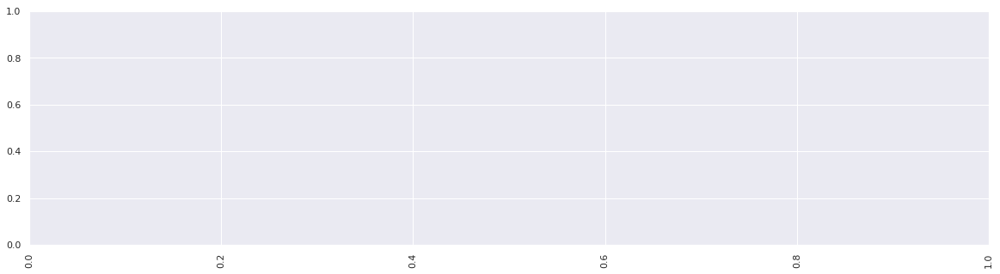

In [73]:
plt.figure(figsize=(20,5))
#sns.boxplot(x="category", y="nutri_score", hue="", palette="magma", data=nutrition_table)
plt.xticks(rotation=90);

# Conclusion <a class="anchor" id="conclusion"></a>

* The Gaussian Mixture Model is able to cluster the data in a useful way depending on their nutrition-tables. We have found various type of clusters that hold differnt product categories.
* The model can even tell us how certain it is about the clustering assignment. 
* The probabilistic nature of the model can tell us something about competing clusters as well. Competitors could be a good choice for some products. Sometimes the competitors are neighborhood clusters but additionally we found some attractions towards a mixed outlier clusters.
* We can also find anomalies (both rare and wrong entries).
* There is also an anomaly-cluster - that holds many outliers, wrong entries and seldom products.
* We found that there is a strong need to build a model that takes into account the discrete nature of zero-entries like zero fat or zero proteins. This would probably have a huge impact to the quality of clustering results, certainty and anomaly detection!
* Besides these benefits the model needs much predatory work (cleaning, transforming, scaling the data)
* It is also really depending on the decisions we make (e.g. the transformation-features, the number of components (cluster), the threshold we set to define an anomaly). Consequently hyperparameter selection is the most crucial part.
* But the model seems to be worth this work! It has much more to offer than a bunch of other clustering algorithms like K-Means for example.

# Outlook <a class="anchor" id="outlook"></a>

* We should try to find an automatic and well working way to choose the transformation-features and the number of components so our model gets more precisely and doesn't depend on our manual choices too much. It would also help when we add alot of new and different products because this would probably change our distributions and therefore our transformation-features and the number of components.
* There is a strong [need to build a more sophisticated model](https://www.kaggle.com/allunia/lighthouses-for-hidden-treasures-in-our-groceries) that can deal with discrete zero-entries and continous features higher than zero. For this model we have to setup the Expectation-Maximization learning and we have to show that this model works much better.
* First of all we should test our model on new, unseen data to see if it can also work with them correctly. As the input of new features is a saturating procedure, there will be less common products in the future and perhaps more specials. In addition you can use the app from all-over the world. Consequently the data is time- and space- dependent. For this reason a good strategy for refitting and validation is needed. This could include user feedbacks as well to make sure that predicted anomalies are really anomalies or if an uncertain product could be placed into another cluster. 
* To make our model stronger we could include more features like the ingredients list or the product names we always had peeked at. This could mean to introduce a further clustering based on these features or to build a model that deals with all features at once each update step.
* Luckily gaussian mixture can be split into parallel working data chunks. As responsibilites are calculated per data spot and the center  & covariance updates are sums that can be split there is no barrier for bigdata without exploding number of components.


